# Modelo ARIMA diario para todos los ETFs

Este notebook aplica modelos ARIMA a los retornos logarítmicos diarios de todos los ETFs válidos. Para cada ETF se seleccionan de forma individual los parámetros del modelo mediante una búsqueda de varias combianciones.

Después, se generan predicciones mediante validación temporal progresiva, utilizando en cada paso solo la información disponible hasta ese momento. Los resultados se comparan con modelos de referencia simples, como el último valor observado y el modelo cero, y se guardan en archivos CSV para su análisis posterior.

In [ ]:
import pandas as pd

# Datos del preprocesado
adj_close = pd.read_csv(
    "../../Datos_csv/adj_close.csv",
    index_col=0,
    parse_dates=True
)

volume = pd.read_csv(
    "../../Datos_csv/volume.csv",
    index_col=0,
    parse_dates=True
)

In [2]:
import numpy as np
import warnings

ret_log_diff = np.log(adj_close).diff()

In [3]:
import json

with open('../../Datos_csv/tickers_estacionalidad.json', 'r', encoding='utf-8') as f:
    est_data = json.load(f)

tickers_filtrados = est_data['tickers_filtrados']
etfs_eliminados   = est_data['etfs_eliminados']

print('ETFs validos:', len(tickers_filtrados))
print('ETFs eliminados:', etfs_eliminados)

ETFs validos: 58
ETFs eliminados: ['BIL', 'EWY', 'GLD', 'IAU', 'SHY']


In [4]:
# Split temporal: mismo corte que modelos ML
# 2024-W29 termina el viernes 2024-07-19 -> train hasta esa fecha
# 2024-W30 empieza el lunes 2024-07-22  -> test desde esa fecha
CUTOFF_DATE = pd.Timestamp('2024-07-19')

splits = {}
for etf in tickers_filtrados:
    serie_ret_log = ret_log_diff[etf].dropna()
    train = serie_ret_log.loc[:CUTOFF_DATE]
    test  = serie_ret_log.loc[CUTOFF_DATE + pd.Timedelta(days=1):]
    if len(test) < 10 or len(train) < 200:
        continue
    splits[etf] = {'cutoff': CUTOFF_DATE, 'train': train, 'test': test}

etf_ex = list(splits.keys())[0]
print(f'ETFs con datos suficientes: {len(splits)}')
print(f'Cutoff: {CUTOFF_DATE.date()}')
print(f'Train: {splits[etf_ex]["train"].index.min().date()} -> '
      f'{splits[etf_ex]["train"].index.max().date()} | n = {len(splits[etf_ex]["train"])}')
print(f'Test : {splits[etf_ex]["test"].index.min().date()} -> '
      f'{splits[etf_ex]["test"].index.max().date()} | n = {len(splits[etf_ex]["test"])}')

ETFs con datos suficientes: 58
Cutoff: 2024-07-19
Train: 2021-01-05 -> 2024-07-19 | n = 890
Test : 2024-07-22 -> 2026-02-02 | n = 385


Cutoff: 2024-07-19 (último día de 2024-W29)

Train: 2021-01-05 -> 2024-07-19 (mismo corte que modelos ML)

Test : 2024-07-22 -> fin de datos (~2026-02)

## Búsqueda de mejores parámetros ARIMA

**Ljung-Box** contrasta si los residuos tienen autocorrelación. Queremos p_value > 0.05: residuos sin estructura, cercanos a ruido blanco.

In [5]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tools.sm_exceptions import ValueWarning, ConvergenceWarning

# Warnings fuera
warnings.filterwarnings("ignore", category=ValueWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", message="Non-invertible starting MA parameters found.*", category=UserWarning)
warnings.filterwarnings("ignore", message="Non-stationary starting autoregressive parameters found.*", category=UserWarning)

resumen_rows = []
preds_por_etf = {}
params_por_etf = {}

p_values = range(0, 6)
q_values = range(0, 6)
d = 0


In [6]:
mejores_modelos = {}

for etf, data in splits.items():
    print(f"\n Seleccionando parámetros ARIMA para: {etf}")
    train = data["train"]
    grid = []
    
    for p in p_values:
        for q in q_values:
            try:
                # Ajuste del modelo
                res = ARIMA(train, order=(p, d, q), trend="n").fit()
                # Test de Ljung-Box para ruido blanco en residuos
                lb = acorr_ljungbox(res.resid.dropna(), lags=[20], return_df=True)
                
                grid.append({
                    "p": p, "q": q, "AIC": res.aic, "BIC": res.bic,
                    "p_value": lb["lb_pvalue"].iloc[-1], "stat": lb["lb_stat"].iloc[-1]
                })
            except: 
                continue

    grid_df = pd.DataFrame(grid)
    
    # Filtrar: No (0,0,0) y que los residuos sean ruido blanco (p_value > 0.05)
    cand = grid_df[(grid_df["p_value"] > 0.05) & ~((grid_df["p"] == 0) & (grid_df["q"] == 0))]
    
    if not cand.empty:
        # Seleccionamos el mejor por AIC/BIC
        best = cand.sort_values(["AIC", "BIC"]).iloc[0]
        order_elegido = (int(best["p"]), 0, int(best["q"]))
        
        # Guardamos en el diccionario
        mejores_modelos[etf] = {
            "order": order_elegido,
            "stats": best.to_dict()
        }
        
        print(f" Modelo seleccionado para {etf}: ARIMA{order_elegido}\n")
    else:
        print(f" No se encontró un modelo ARIMA válido para {etf} que supere el test Ljung-Box.\n")




 Seleccionando parámetros ARIMA para: AGG
 Modelo seleccionado para AGG: ARIMA(2, 0, 0)


 Seleccionando parámetros ARIMA para: BND
 Modelo seleccionado para BND: ARIMA(2, 0, 0)


 Seleccionando parámetros ARIMA para: DBC
 Modelo seleccionado para DBC: ARIMA(5, 0, 3)


 Seleccionando parámetros ARIMA para: DIA
 Modelo seleccionado para DIA: ARIMA(0, 0, 1)


 Seleccionando parámetros ARIMA para: DVY
 Modelo seleccionado para DVY: ARIMA(0, 0, 2)


 Seleccionando parámetros ARIMA para: EEM
 Modelo seleccionado para EEM: ARIMA(0, 0, 1)


 Seleccionando parámetros ARIMA para: EFA
 Modelo seleccionado para EFA: ARIMA(1, 0, 0)


 Seleccionando parámetros ARIMA para: EWG
 Modelo seleccionado para EWG: ARIMA(2, 0, 4)


 Seleccionando parámetros ARIMA para: EWJ
 Modelo seleccionado para EWJ: ARIMA(0, 0, 1)


 Seleccionando parámetros ARIMA para: EWQ
 Modelo seleccionado para EWQ: ARIMA(2, 0, 2)


 Seleccionando parámetros ARIMA para: EWT
 Modelo seleccionado para EWT: ARIMA(1, 0, 0)


 Seleccio

## Modelo ARIMA / BASE / CEROS

In [ ]:
resultados_preds = {}

for etf, config in mejores_modelos.items():
    print(f"Calculando predicciones para: {etf}")
    order = config["order"]
    y_train = splits[etf]["train"]
    y_test = splits[etf]["test"]
    
    # Walk-forward ARIMA
    history = y_train.copy()
    preds_arima = []
    for val_real in y_test:
        model_fit = ARIMA(history, order=order, trend="n").fit()
        preds_arima.append(model_fit.forecast(steps=1).iloc[0])
        history = pd.concat([history, pd.Series([val_real], index=[y_test.index[len(preds_arima)-1]])])

    # Modelo base: predice el valor del día anterior
    preds_base = [y_train.iloc[-1]] + y_test.iloc[:-1].tolist()

    # Modelo ceros: predice siempre cero
    preds_zeros = np.zeros(len(y_test))

    resultados_preds[etf] = pd.DataFrame({
        "real": y_test,
        "arima": preds_arima,
        "base": preds_base,
        "zeros": preds_zeros
    }, index=y_test.index)

## Comparación de Errores

In [8]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error

rows_tabla = []
for etf, df in resultados_preds.items():
    y_true = df['real']
    rows_tabla.append({
        'ETF':        etf,
        'MAE_ARIMA':  mean_absolute_error(y_true, df['arima']),
        'MAE_BASE':   mean_absolute_error(y_true, df['base']),
        'MAE_ZEROS':  mean_absolute_error(y_true, df['zeros']),
        'RMSE_ARIMA': root_mean_squared_error(y_true, df['arima']),
        'RMSE_BASE':  root_mean_squared_error(y_true, df['base']),
        'RMSE_ZEROS': root_mean_squared_error(y_true, df['zeros']),
    })

tabla_comparativa_diario = pd.DataFrame(rows_tabla).set_index('ETF')

def resaltar_minimo(row):
    styles = pd.Series([''] * len(row), index=row.index)
    for grupo in [['MAE_ARIMA', 'MAE_BASE', 'MAE_ZEROS'],
                  ['RMSE_ARIMA', 'RMSE_BASE', 'RMSE_ZEROS']]:
        styles[row[grupo].idxmin()] = 'font-weight: bold; color: #2d7a2d'
    return styles

try:
    display(
        tabla_comparativa_diario
        .style
        .apply(resaltar_minimo, axis=1)
        .format('{:.6f}')
    )
except AttributeError:
    display(tabla_comparativa_diario.round(6))

,MAE_ARIMA,MAE_BASE,MAE_ZEROS,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS
ETF,,,,,,
AGG,0.002256,0.003168,0.002264,0.002926,0.004027,0.002928
BND,0.002231,0.003174,0.002238,0.002895,0.004017,0.002895
DBC,0.007549,0.010577,0.007618,0.010098,0.013697,0.010159
DIA,0.006673,0.009482,0.006655,0.009725,0.013749,0.009703
DVY,0.006635,0.009568,0.006617,0.009418,0.013354,0.009373
EEM,0.007910,0.011467,0.007920,0.011186,0.015960,0.011175
EFA,0.006937,0.010281,0.006933,0.009905,0.014099,0.009894
EWG,0.008250,0.011829,0.008165,0.011537,0.016193,0.011433
EWJ,0.008897,0.013579,0.008900,0.012647,0.018232,0.012632


## Predicciones vs retorno real

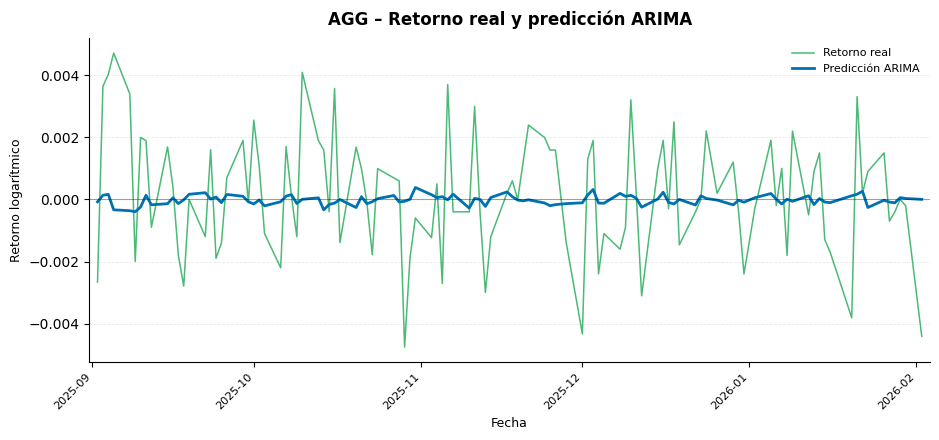

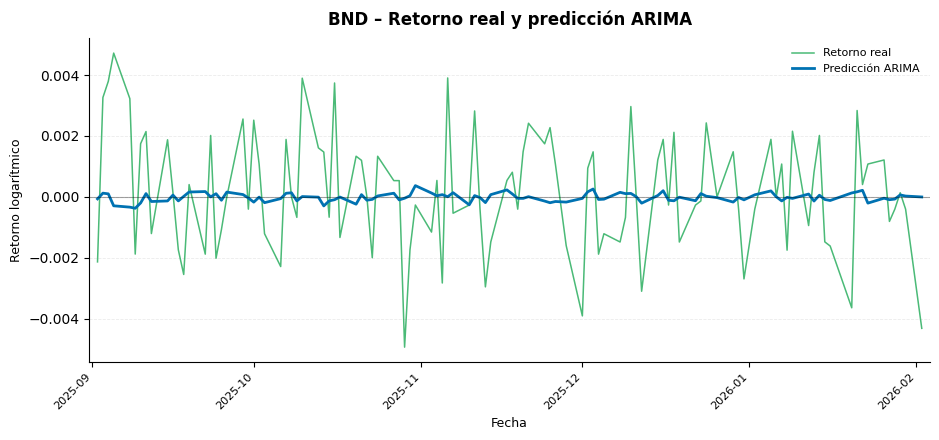

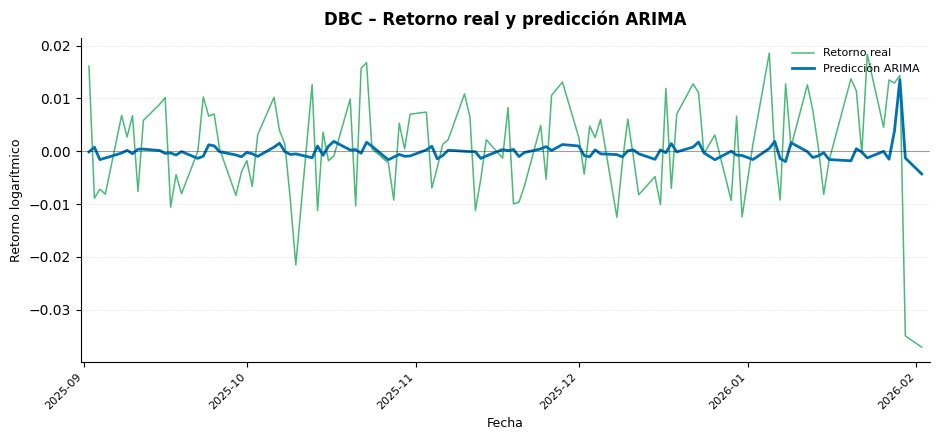

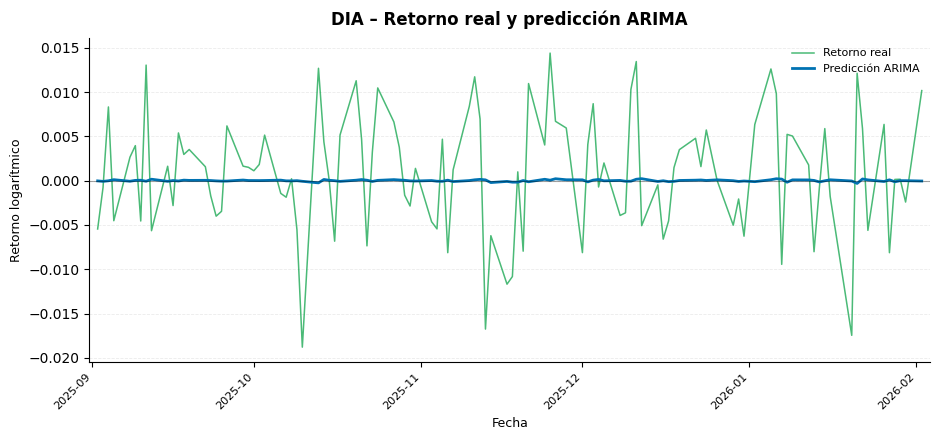

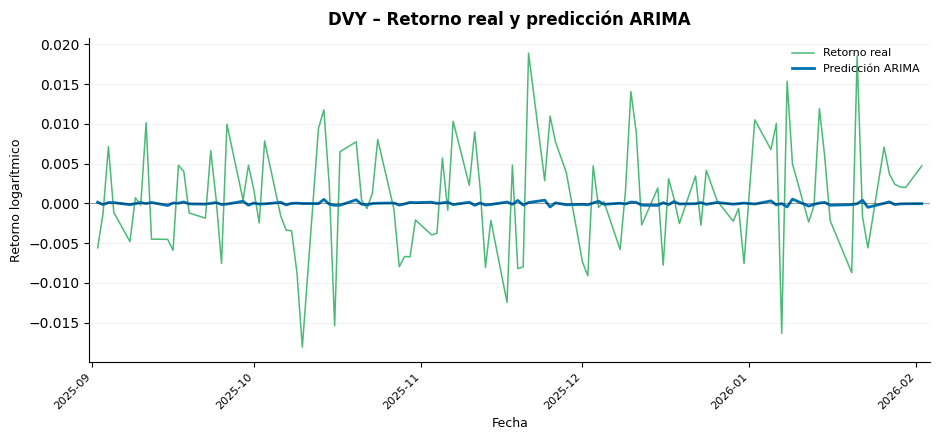

...

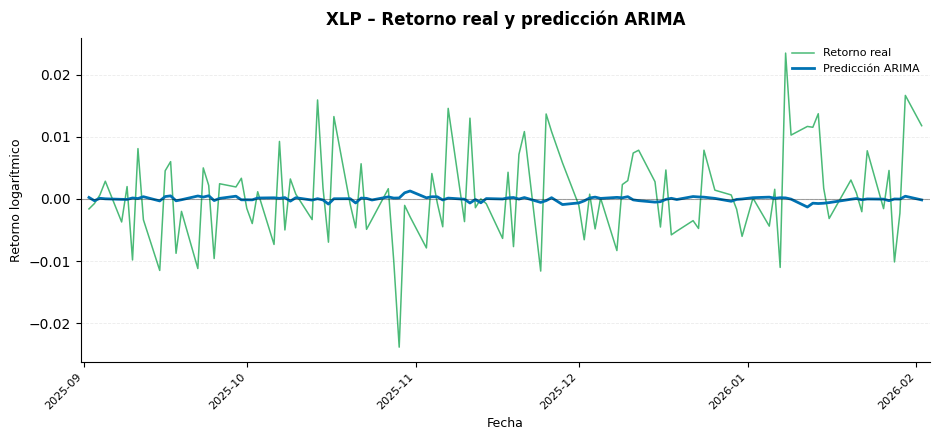

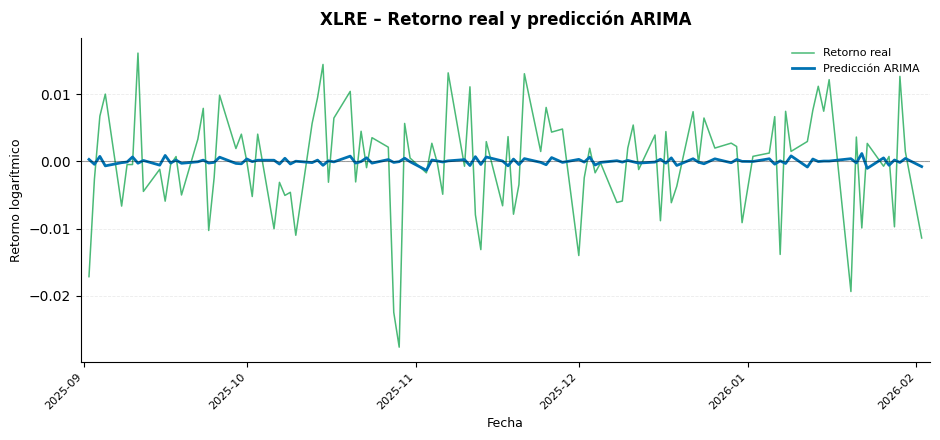

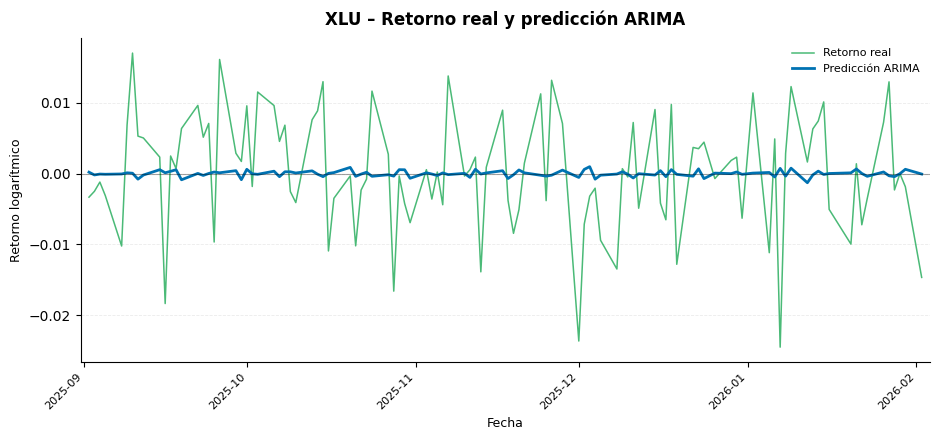

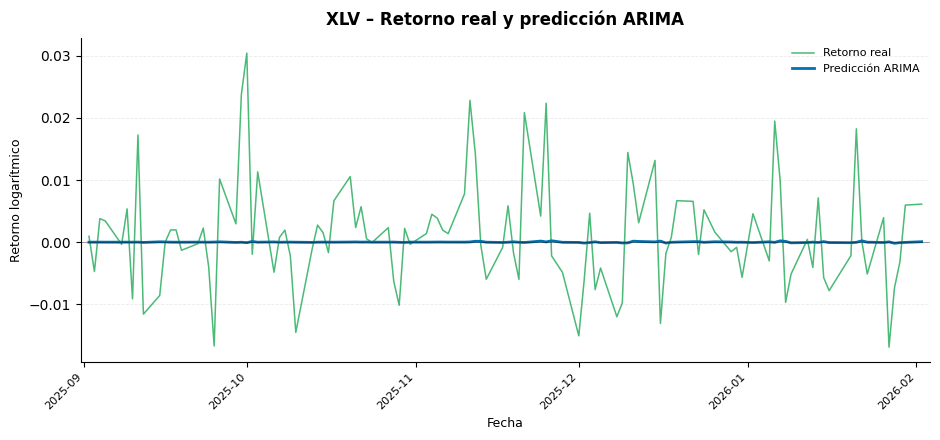

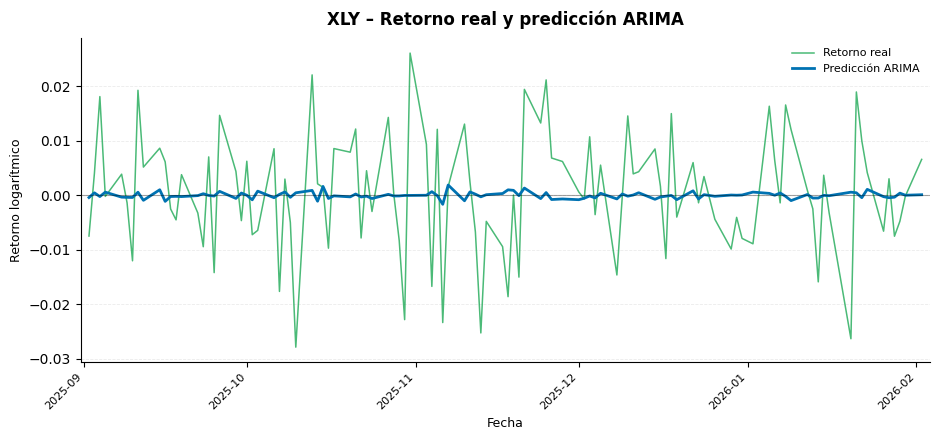

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

color_real  = '#0EA34A'
color_arima = '#0072B2'

fecha_inicio = '2025-09-01'

for etf, df in resultados_preds.items():

    df_plot = df.copy()
    df_plot.index = pd.to_datetime(df_plot.index)
    df_plot = df_plot.loc[fecha_inicio:]
    df_plot = df_plot.dropna(subset=['real', 'arima'])

    fig, ax = plt.subplots(figsize=(9.5, 4.5))

    ax.plot(
        df_plot.index,
        df_plot['real'],
        label='Retorno real',
        color=color_real,
        linewidth=1.1,
        alpha=0.75
    )

    ax.plot(
        df_plot.index,
        df_plot['arima'],
        label='Predicción ARIMA',
        color=color_arima,
        linewidth=2
    )

    ax.axhline(
        0,
        color='black',
        linewidth=0.8,
        alpha=0.35
    )

    ax.xaxis.set_major_locator(
        mdates.MonthLocator()
    )

    ax.xaxis.set_major_formatter(
        mdates.DateFormatter('%Y-%m')
    )

    plt.xticks(
        rotation=45,
        ha='right',
        fontsize=8
    )

    ax.set_title(
        f'{etf} – Retorno real y predicción ARIMA',
        fontsize=12,
        fontweight='bold',
        pad=10
    )

    ax.set_xlabel('Fecha', fontsize=9)
    ax.set_ylabel('Retorno logarítmico', fontsize=9)

    ax.grid(
        axis='y',
        linestyle='--',
        linewidth=0.6,
        alpha=0.25
    )

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.legend(
        fontsize=8,
        frameon=False,
        loc='upper right'
    )

    ax.margins(x=0.01)

    plt.tight_layout()
    plt.show()

## Predicciones amplificadas ×10

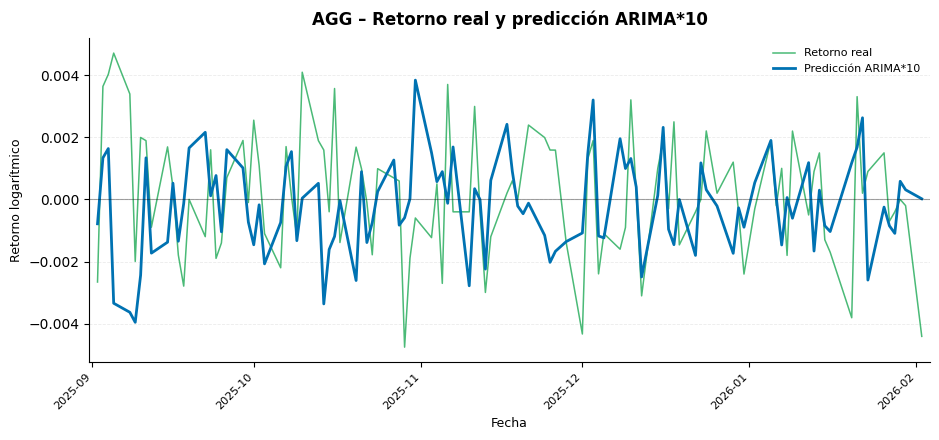

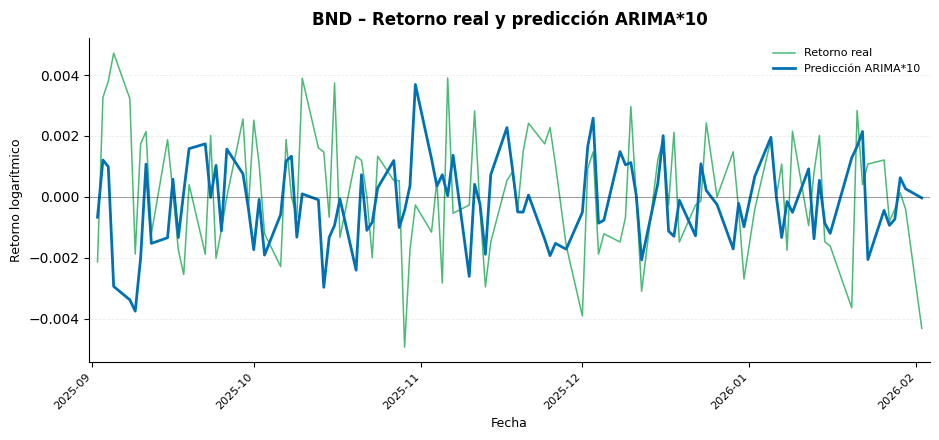

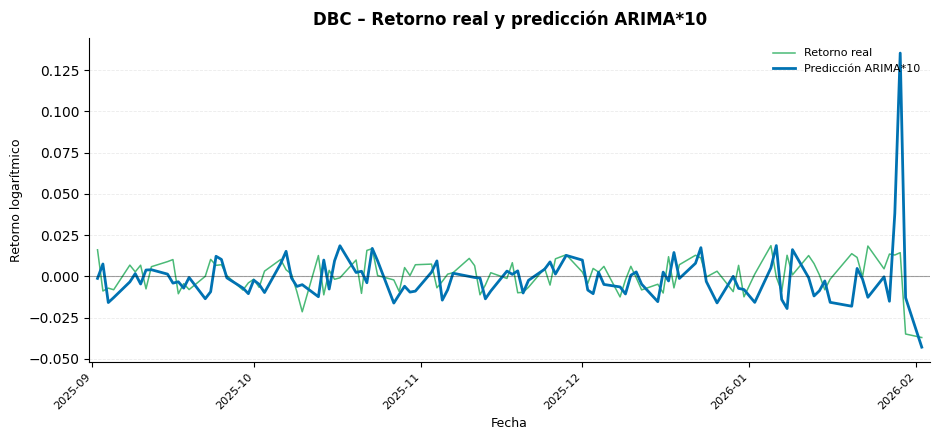

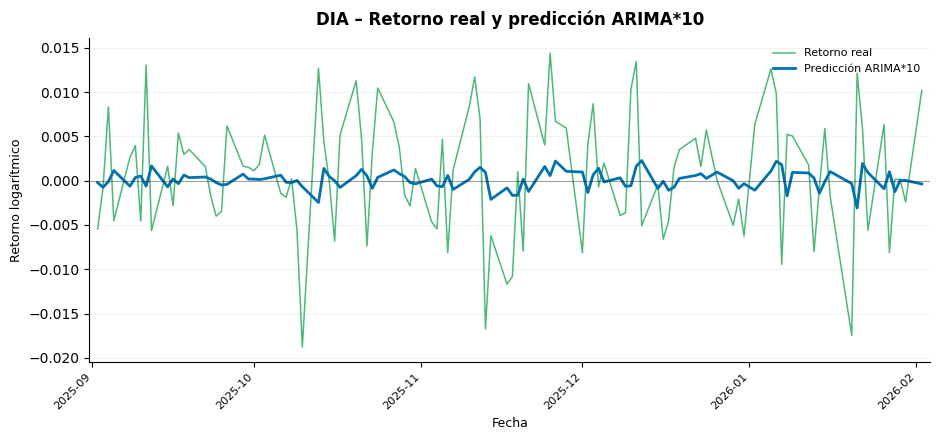

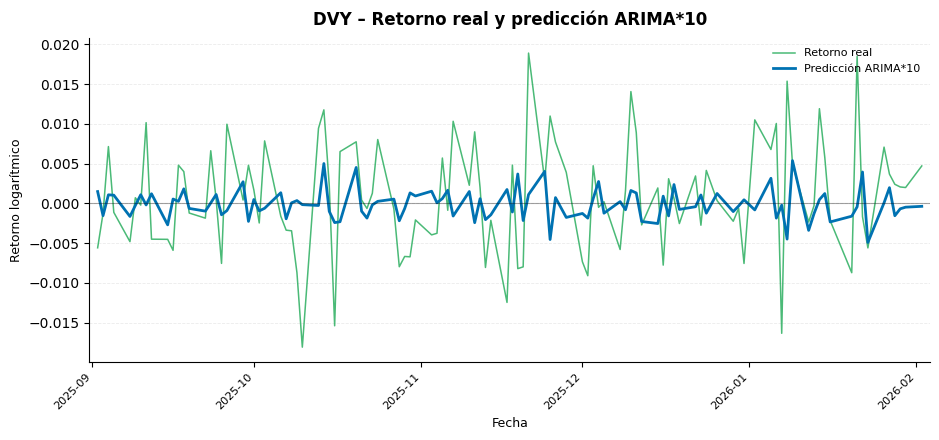

...

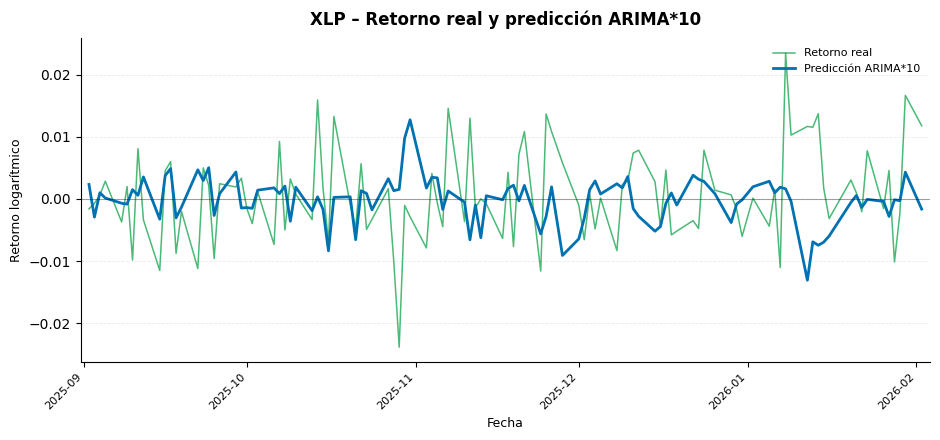

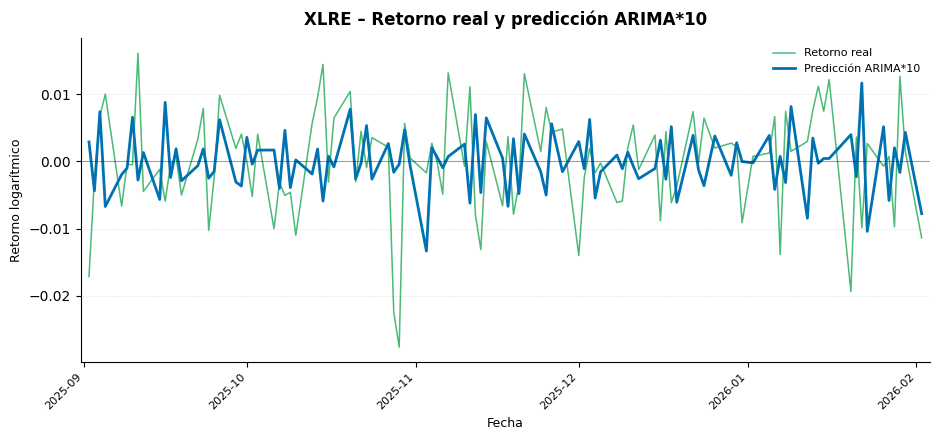

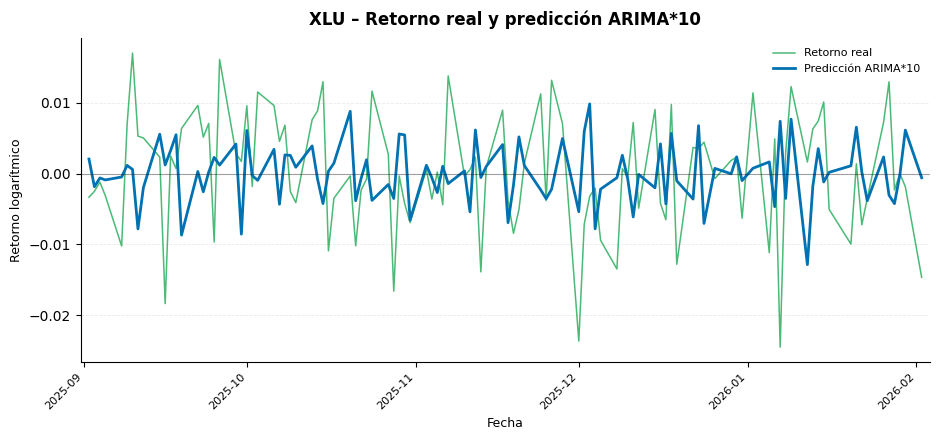

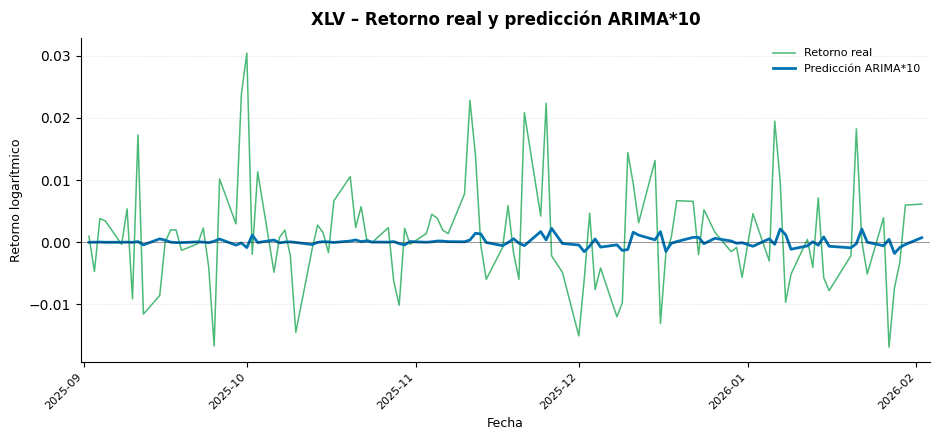

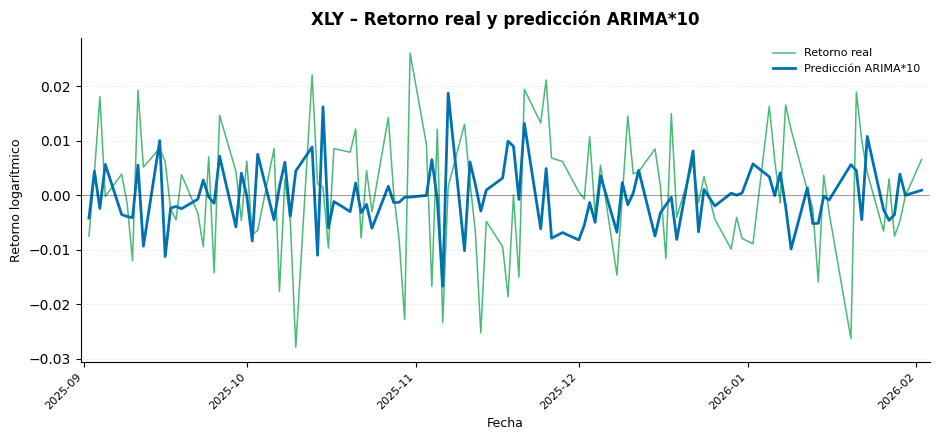

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

color_real  = '#0EA34A'
color_arima = '#0072B2'

fecha_inicio = '2025-09-01'

for etf, df in resultados_preds.items():

    df_plot = df.copy()
    df_plot.index = pd.to_datetime(df_plot.index)
    df_plot = df_plot.loc[fecha_inicio:]
    df_plot = df_plot.dropna(subset=['real', 'arima'])

    fig, ax = plt.subplots(figsize=(9.5, 4.5))

    ax.plot(
        df_plot.index,
        df_plot['real'],
        label='Retorno real',
        color=color_real,
        linewidth=1.1,
        alpha=0.75
    )

    ax.plot(
        df_plot.index,
        df_plot['arima']*10,
        label='Predicción ARIMA*10',
        color=color_arima,
        linewidth=2
    )

    ax.axhline(
        0,
        color='black',
        linewidth=0.8,
        alpha=0.35
    )

    ax.xaxis.set_major_locator(
        mdates.MonthLocator()
    )

    ax.xaxis.set_major_formatter(
        mdates.DateFormatter('%Y-%m')
    )

    plt.xticks(
        rotation=45,
        ha='right',
        fontsize=8
    )

    ax.set_title(
        f'{etf} – Retorno real y predicción ARIMA*10',
        fontsize=12,
        fontweight='bold',
        pad=10
    )

    ax.set_xlabel('Fecha', fontsize=9)
    ax.set_ylabel('Retorno logarítmico', fontsize=9)

    ax.grid(
        axis='y',
        linestyle='--',
        linewidth=0.6,
        alpha=0.25
    )

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.legend(
        fontsize=8,
        frameon=False,
        loc='upper right'
    )

    ax.margins(x=0.01)

    plt.tight_layout()
    plt.show()

### Kappa de Cohen

Se evalúa si el modelo acierta la dirección del movimiento (sube/baja), no solo el error numérico.

In [11]:
from sklearn.metrics import cohen_kappa_score, accuracy_score

metricas_direccionales = []

for etf, df in resultados_preds.items():
    # Creamos las variables binarias (1 si sube > 0, 0 si baja o igual)
    real_dir = (df["real"] > 0).astype(int)
    arima_dir = (df["arima"] > 0).astype(int)
    base_dir = (df["base"] > 0).astype(int)
    # Nota: El modelo ZEROS no tiene dirección (siempre es 0), así que no lo incluimos en esta comparación.

    # Cálculo de Kappa de Cohen 
    kappa_arima = cohen_kappa_score(real_dir, arima_dir)
    kappa_base = cohen_kappa_score(real_dir, base_dir)

    # Número de aciertos de la dirección dividido por el total de predicciones.
    Accuracy_arima = accuracy_score(real_dir, arima_dir)
    Accuracy_base = accuracy_score(real_dir, base_dir)

    metricas_direccionales.append({
        "ETF": etf,
        "Kappa_ARIMA": kappa_arima,
        "Kappa_BASE": kappa_base,
        "Accuracy_ARIMA": f"{Accuracy_arima:.2%}",
        "Accuracy_BASE": f"{Accuracy_base:.2%}"
    })

# Mostrar tabla de resultados direccionales
df_direccional = pd.DataFrame(metricas_direccionales).set_index("ETF")
print("Análisis de Dirección (Sube/Baja):")
display(df_direccional)

Análisis de Dirección (Sube/Baja):


,Kappa_ARIMA,Kappa_BASE,Accuracy_ARIMA,Accuracy_BASE
ETF,,,,
AGG,0.076490,0.022579,53.77%,51.17%
BND,0.092580,0.032663,54.55%,51.69%
DBC,0.102878,-0.008343,55.06%,49.61%
DIA,-0.062769,-0.053359,47.27%,47.79%
DVY,-0.014875,-0.067809,49.09%,46.75%
EEM,0.015925,-0.020942,50.39%,49.35%
EFA,-0.015097,-0.033437,48.83%,48.83%
EWG,-0.003448,0.003970,50.13%,50.91%
EWJ,0.067144,-0.101118,53.25%,45.19%


ETFs con Kappa negativo en ARIMA: el modelo acierta menos la dirección que el azar.

In [12]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error
import os

records_export = []
for etf, df_etf in resultados_preds.items():
    y_true = df_etf['real']
    records_export.append({
        'ETF':          etf,
        'RMSE':          root_mean_squared_error(y_true, df_etf['arima']),
        'RMSE_baseline': root_mean_squared_error(y_true, df_etf['base']),
        'RMSE_zeros':    root_mean_squared_error(y_true, df_etf['zeros']),
        'MAE':           mean_absolute_error(y_true, df_etf['arima']),
        'MAE_baseline':  mean_absolute_error(y_true, df_etf['base']),
        'MAE_zeros':     mean_absolute_error(y_true, df_etf['zeros']),
    })

nombre_csv = 'resultados_arima_diario.csv'
out_path = f'../../Datos_csv/{nombre_csv}'
pd.DataFrame(records_export).to_csv(out_path, index=False)
print(f'Resultados guardados en: {out_path}')

Resultados guardados en: ../../Datos_csv/resultados_arima_diario.csv


In [ ]:
from sklearn.metrics import cohen_kappa_score, accuracy_score

rows_dir = []
for etf, df_etf in resultados_preds.items():
    real_dir  = (df_etf['real']  > 0).astype(int)
    arima_dir = (df_etf['arima'] > 0).astype(int)
    base_dir  = (df_etf['base']  > 0).astype(int)
    try:
        kappa_a = cohen_kappa_score(real_dir, arima_dir)
    except Exception:
        kappa_a = float('nan')
    try:
        kappa_b = cohen_kappa_score(real_dir, base_dir)
    except Exception:
        kappa_b = float('nan')
    rows_dir.append({
        'ETF':            etf,
        'Kappa_ARIMA':    kappa_a,
        'Kappa_BASE':     kappa_b,
        'Accuracy_ARIMA': f'{accuracy_score(real_dir, arima_dir):.2%}',
        'Accuracy_BASE':  f'{accuracy_score(real_dir, base_dir):.2%}',
    })



## Análisis de resultados — ARIMA diario

Resumen comparativo del modelo ARIMA frente a los benchmarks BASE (naive t-1) y ZEROS, con análisis por grupo de activo y dirección del movimiento.

In [14]:
GRUPOS_ETF = {
    'Core US':        ['SPY','IVV','VOO','QQQ','DIA','IWM','MDY','IJR','ITOT','VTI'],
    'Factores':       ['MTUM','QUAL','USMV','VLUE','IWF','IWD','VUG','VTV','VIG','DVY','SCHD'],
    'Sectores':       ['XLK','XLF','XLV','XLY','XLP','XLE','XLI','XLB','XLU','XLRE','VNQ'],
    'Internacional':  ['EFA','IEFA','VEA','EEM','IEMG','VWO','EWJ','EWG','EWQ','EWU','EWT','EWZ','FXI','MCHI','INDA'],
    'Renta fija':     ['AGG','BND','LQD','HYG','JNK','TLT','IEF','SHY','TIP'],
    'Materias primas':['GLD','IAU','SLV','USO','DBC']
}
etf_to_grupo = {t: g for g, tickers in GRUPOS_ETF.items() for t in tickers}

df_anal = tabla_comparativa_diario.reset_index()
df_anal['Grupo']           = df_anal['ETF'].map(etf_to_grupo).fillna('Otros')
df_anal['Mejora_vs_base']  = (df_anal['RMSE_BASE']  - df_anal['RMSE_ARIMA']) / df_anal['RMSE_BASE']  * 100
df_anal['Mejora_vs_zeros'] = (df_anal['RMSE_ZEROS'] - df_anal['RMSE_ARIMA']) / df_anal['RMSE_ZEROS'] * 100
df_anal['Bate_base']  = (df_anal['RMSE_ARIMA'] < df_anal['RMSE_BASE']).astype(int)
df_anal['Bate_zeros'] = (df_anal['RMSE_ARIMA'] < df_anal['RMSE_ZEROS']).astype(int)

tabla_global = pd.DataFrame({
    'RMSE': [df_anal['RMSE_ARIMA'].mean(), df_anal['RMSE_BASE'].mean(),  df_anal['RMSE_ZEROS'].mean()],
    'MAE':  [df_anal['MAE_ARIMA'].mean(),  df_anal['MAE_BASE'].mean(),   df_anal['MAE_ZEROS'].mean()],
}, index=['ARIMA', 'BASE', 'ZEROS'])

print('Media global — ARIMA diario')
display(tabla_global.style.format('{:.6f}').highlight_min(color='green', axis=0))

Media global — ARIMA diario


,RMSE,MAE
ARIMA,0.011270,0.007868
BASE,0.016129,0.011485
ZEROS,0.011239,0.007851


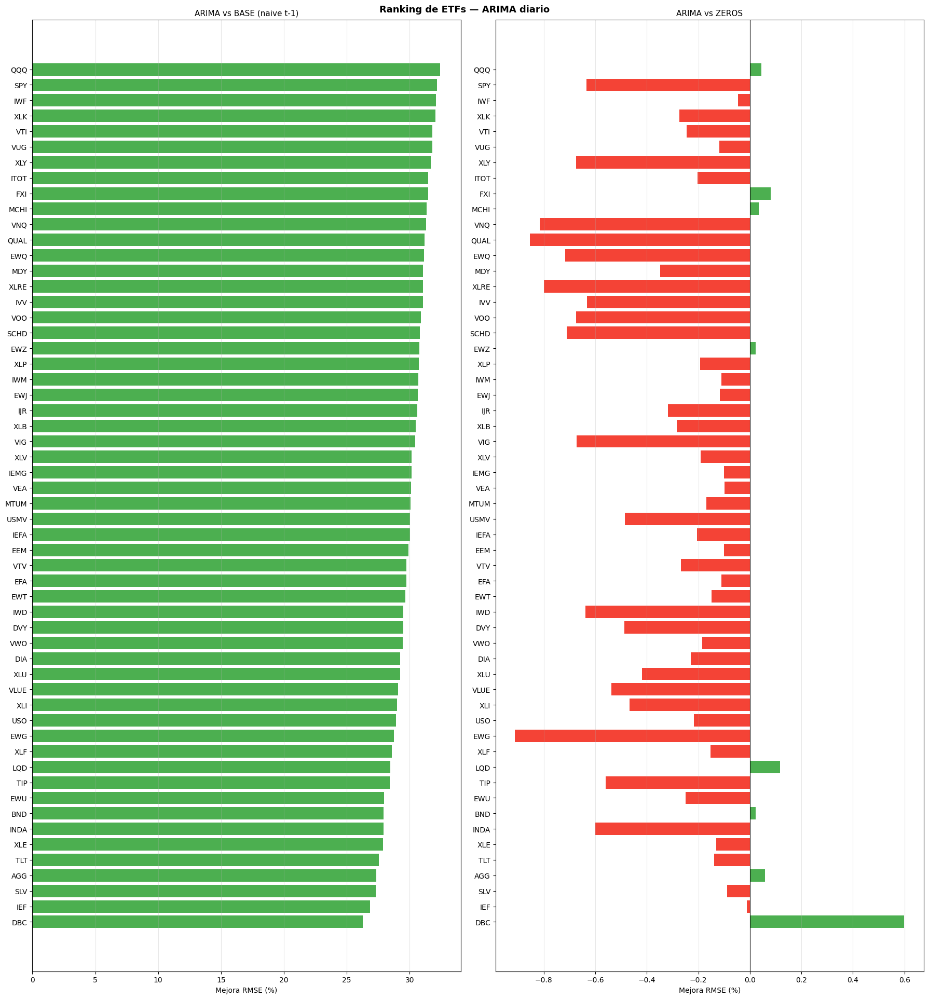

In [15]:
df_sorted = df_anal.sort_values('Mejora_vs_base')
fig, axes = plt.subplots(1, 2, figsize=(18, max(8, len(df_anal) * 0.35)))

for ax, col, titulo in zip(
    axes,
    ['Mejora_vs_base', 'Mejora_vs_zeros'],
    ['ARIMA vs BASE (naive t-1)', 'ARIMA vs ZEROS']
):
    colores = ['#4CAF50' if v >= 0 else '#F44336' for v in df_sorted[col]]
    ax.barh(df_sorted['ETF'], df_sorted[col], color=colores)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_xlabel('Mejora RMSE (%)')
    ax.set_title(titulo, fontsize=11)
    ax.grid(axis='x', alpha=0.3)

plt.suptitle('Ranking de ETFs — ARIMA diario', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [16]:
df_dir_res = df_direccional.copy().reset_index()
df_dir_res['Kappa_ARIMA'] = pd.to_numeric(df_dir_res['Kappa_ARIMA'], errors='coerce')
df_dir_res['Kappa_BASE']  = pd.to_numeric(df_dir_res['Kappa_BASE'],  errors='coerce')
acc_arima = df_dir_res['Accuracy_ARIMA'].str.replace('%', '').astype(float)
acc_base  = df_dir_res['Accuracy_BASE'].str.replace('%', '').astype(float)

print(f'Kappa medio ARIMA : {df_dir_res["Kappa_ARIMA"].mean():.4f}')
print(f'Kappa medio BASE  : {df_dir_res["Kappa_BASE"].mean():.4f}')
print(f'Accuracy media ARIMA: {acc_arima.mean():.2f}%')
print(f'Accuracy media BASE : {acc_base.mean():.2f}%')

display(df_dir_res.set_index('ETF').sort_values('Kappa_ARIMA', ascending=False))

Kappa medio ARIMA : -0.0012
Kappa medio BASE  : -0.0385
Accuracy media ARIMA: 49.65%
Accuracy media BASE : 48.50%


,Kappa_ARIMA,Kappa_BASE,Accuracy_ARIMA,Accuracy_BASE
ETF,,,,
XLP,0.112700,-0.097162,55.58%,45.19%
DBC,0.102878,-0.008343,55.06%,49.61%
EWZ,0.098337,-0.103721,54.55%,45.19%
BND,0.092580,0.032663,54.55%,51.69%
LQD,0.077335,0.062652,53.77%,53.25%
AGG,0.076490,0.022579,53.77%,51.17%
TIP,0.069887,0.037081,52.99%,52.21%
EWJ,0.067144,-0.101118,53.25%,45.19%
QQQ,0.063999,-0.059491,51.95%,48.31%


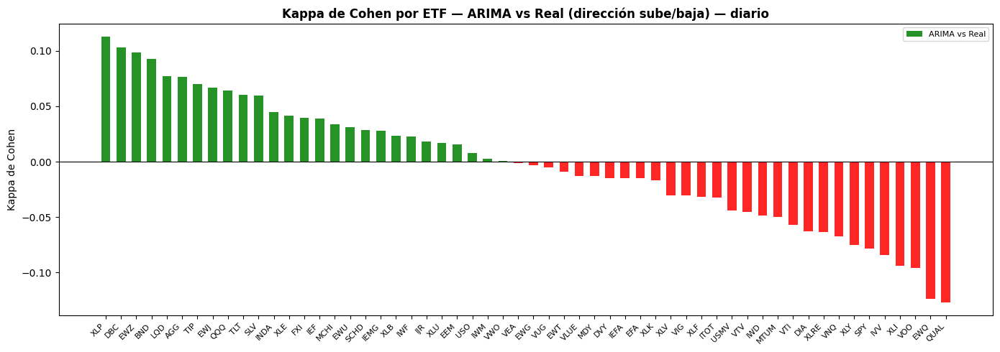

In [34]:

df_plot_kappa = df_dir_res.set_index('ETF').sort_values('Kappa_ARIMA', ascending=False)

fig, ax = plt.subplots(figsize=(14, 5))
x = range(len(df_plot_kappa))

colores = ['green' if v >= 0 else 'red' for v in df_plot_kappa['Kappa_ARIMA']]

ax.bar(list(x), df_plot_kappa['Kappa_ARIMA'], width=0.6,
        color=colores, alpha=0.85, label='ARIMA vs Real')

ax.axhline(0,    color='black', linewidth=0.8)

ax.set_xticks(list(x))
ax.set_xticklabels(df_plot_kappa.index, rotation=45, ha='right', fontsize=8)
ax.set_ylabel('Kappa de Cohen')
ax.set_title(
    f'Kappa de Cohen por ETF — ARIMA vs Real (dirección sube/baja) — diario',
    fontweight='bold'
)
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()


## Resumen por grupo de activos — ARIMA diario

Tabla agregada a nivel de grupo (RMSE medio, mejora vs benchmarks, cuántos ETFs baten cada benchmark). Después, ETF a ETF dentro de cada grupo.

In [20]:
ORDEN_GRUPOS = ['Core US', 'Factores', 'Sectores', 'Internacional', 'Renta fija', 'Materias primas']

# TABLA AGREGADA POR GRUPO
tabla_grupos = (
    df_anal.groupby('Grupo')
    .agg(
        N            =('ETF',             'count'),
        RMSE_ARIMA   =('RMSE_ARIMA',      'mean'),
        RMSE_BASE    =('RMSE_BASE',       'mean'),
        RMSE_ZEROS   =('RMSE_ZEROS',      'mean'),
        MAE_ARIMA    =('MAE_ARIMA',       'mean'),
        Mejora_base  =('Mejora_vs_base',  'mean'),
        Mejora_zeros =('Mejora_vs_zeros', 'mean'),
        Bate_base    =('Bate_base',       'sum'),
        Bate_zeros   =('Bate_zeros',      'sum'),
    )
    .reindex([g for g in ORDEN_GRUPOS if g in df_anal['Grupo'].unique()])
    .reset_index()
)
tabla_grupos['Bate_base_str']  = tabla_grupos.apply(lambda r: f'{int(r.Bate_base)}/{int(r.N)}',  axis=1)
tabla_grupos['Bate_zeros_str'] = tabla_grupos.apply(lambda r: f'{int(r.Bate_zeros)}/{int(r.N)}', axis=1)

fmt = {c: '{:.5f}' for c in ['RMSE_ARIMA', 'RMSE_BASE', 'RMSE_ZEROS', 'MAE_ARIMA']}
fmt.update({'Mejora_base': '{:.2f} %', 'Mejora_zeros': '{:.2f} %'})

print('POR GRUPO DE ACTIVOS — ARIMA diario')
display(
    tabla_grupos[['Grupo', 'N', 'RMSE_ARIMA', 'RMSE_BASE', 'RMSE_ZEROS',
                  'MAE_ARIMA', 'Mejora_base', 'Mejora_zeros', 'Bate_base_str', 'Bate_zeros_str']]
    .rename(columns={
        'Bate_base_str':  'Bate base',
        'Bate_zeros_str': 'Bate zeros',
        'Mejora_base':    'Mejora vs base (%)',
        'Mejora_zeros':   'Mejora vs zeros (%)',
    })
    .style.format(fmt)
    .highlight_min(subset=['RMSE_ARIMA'], color='green')
    .highlight_max(subset=['RMSE_ARIMA'], color='red')
)

POR GRUPO DE ACTIVOS — ARIMA diario


,Grupo,N,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS,MAE_ARIMA,Mejora vs base (%),Mejora vs zeros (%),Bate base,Bate zeros
0,Core US,10,0.01190,0.01730,0.01187,0.00802,31.146695,-0.334950,10/10,1/10
1,Factores,11,0.01055,0.01518,0.01051,0.00722,30.386859,-0.453344,11/11,0/11
2,Sectores,11,0.01176,0.01686,0.01171,0.00841,30.195895,-0.399677,11/11,0/11
3,Internacional,15,0.01232,0.01764,0.01230,0.00870,29.938464,-0.227210,15/15,3/15
4,Renta fija,6,0.00403,0.00557,0.00403,0.00312,27.756671,-0.084878,6/6,3/6
5,Materias primas,3,0.01921,0.02657,0.01921,0.01311,27.498679,0.098163,3/3,1/3


In [21]:
fmt_etf = {
    'RMSE_ARIMA':      '{:.5f}',
    'RMSE_BASE':       '{:.5f}',
    'RMSE_ZEROS':      '{:.5f}',
    'MAE_ARIMA':       '{:.5f}',
    'Mejora_vs_base':  '{:.2f} %',
    'Mejora_vs_zeros': '{:.2f} %',
}

cols_etf = ['ETF', 'RMSE_ARIMA', 'RMSE_BASE', 'RMSE_ZEROS',
            'MAE_ARIMA', 'Mejora_vs_base', 'Mejora_vs_zeros', 'Bate_base', 'Bate_zeros']

for grupo in ORDEN_GRUPOS:
    sub = df_anal[df_anal['Grupo'] == grupo][cols_etf].sort_values('RMSE_ARIMA').reset_index(drop=True)
    if sub.empty:
        continue
    print(f'\n{grupo} ({len(sub)} ETFs)')
    display(
        sub.style
        .format(fmt_etf)
        .highlight_min(subset=['RMSE_ARIMA'], color='green')
        .highlight_max(subset=['RMSE_ARIMA'], color='red')
    )


Core US (10 ETFs)


,ETF,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS,MAE_ARIMA,Mejora_vs_base,Mejora_vs_zeros,Bate_base,Bate_zeros
0,DIA,0.00973,0.01375,0.00970,0.00667,29.26 %,-0.23 %,1,0
1,VOO,0.01078,0.01560,0.01070,0.00703,30.90 %,-0.67 %,1,0
2,IVV,0.01085,0.01573,0.01078,0.00703,31.05 %,-0.63 %,1,0
3,ITOT,0.01107,0.01616,0.01105,0.00721,31.49 %,-0.20 %,1,0
4,SPY,0.01117,0.01647,0.01110,0.00709,32.17 %,-0.63 %,1,0
5,VTI,0.01118,0.01639,0.01115,0.00720,31.82 %,-0.24 %,1,0
6,MDY,0.01239,0.01798,0.01235,0.00850,31.07 %,-0.35 %,1,0
7,IJR,0.01389,0.02001,0.01384,0.00982,30.60 %,-0.32 %,1,0
8,QQQ,0.01393,0.02061,0.01393,0.00935,32.43 %,0.04 %,1,1
9,IWM,0.01408,0.02031,0.01406,0.01027,30.67 %,-0.11 %,1,0



Factores (11 ETFs)


,ETF,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS,MAE_ARIMA,Mejora_vs_base,Mejora_vs_zeros,Bate_base,Bate_zeros
0,USMV,0.00744,0.01064,0.00741,0.00518,30.03 %,-0.49 %,1,0
1,VTV,0.00884,0.01258,0.00882,0.00608,29.75 %,-0.27 %,1,0
2,VIG,0.00897,0.01289,0.00891,0.00611,30.42 %,-0.67 %,1,0
3,IWD,0.00926,0.01314,0.00920,0.00626,29.50 %,-0.64 %,1,0
4,SCHD,0.00935,0.01352,0.00929,0.00655,30.81 %,-0.71 %,1,0
5,DVY,0.00942,0.01335,0.00937,0.00664,29.47 %,-0.49 %,1,0
6,QUAL,0.01031,0.01497,0.01022,0.00695,31.18 %,-0.85 %,1,0
7,VLUE,0.01119,0.01578,0.01113,0.00786,29.10 %,-0.54 %,1,0
8,MTUM,0.01373,0.01964,0.01371,0.00938,30.08 %,-0.17 %,1,0
9,IWF,0.01376,0.02027,0.01376,0.00922,32.11 %,-0.05 %,1,0



Sectores (11 ETFs)


,ETF,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS,MAE_ARIMA,Mejora_vs_base,Mejora_vs_zeros,Bate_base,Bate_zeros
0,XLP,0.00810,0.01169,0.00808,0.00608,30.75 %,-0.19 %,1,0
1,XLV,0.00989,0.01416,0.00987,0.00721,30.16 %,-0.19 %,1,0
2,XLU,0.00998,0.01410,0.00994,0.00750,29.25 %,-0.42 %,1,0
3,VNQ,0.01039,0.01512,0.01030,0.00755,31.30 %,-0.82 %,1,0
4,XLRE,0.01041,0.01510,0.01033,0.00758,31.05 %,-0.80 %,1,0
5,XLI,0.01126,0.01586,0.01121,0.00784,29.01 %,-0.47 %,1,0
6,XLB,0.01159,0.01668,0.01156,0.00833,30.47 %,-0.28 %,1,0
7,XLF,0.01160,0.01624,0.01158,0.00783,28.56 %,-0.15 %,1,0
8,XLY,0.01469,0.02150,0.01459,0.01057,31.70 %,-0.67 %,1,0
9,XLE,0.01477,0.02047,0.01475,0.01049,27.86 %,-0.13 %,1,0



Internacional (15 ETFs)


,ETF,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS,MAE_ARIMA,Mejora_vs_base,Mejora_vs_zeros,Bate_base,Bate_zeros
0,INDA,0.00869,0.01206,0.00864,0.00646,27.91 %,-0.60 %,1,0
1,EWU,0.00927,0.01287,0.00925,0.00653,27.96 %,-0.25 %,1,0
2,VEA,0.00972,0.01391,0.00971,0.00687,30.13 %,-0.10 %,1,0
3,IEFA,0.00988,0.01412,0.00986,0.00694,30.03 %,-0.21 %,1,0
4,EFA,0.00990,0.01410,0.00989,0.00694,29.75 %,-0.11 %,1,0
5,VWO,0.01056,0.01497,0.01054,0.00737,29.46 %,-0.19 %,1,0
6,IEMG,0.01088,0.01557,0.01087,0.00770,30.14 %,-0.10 %,1,0
7,EEM,0.01119,0.01596,0.01118,0.00791,29.91 %,-0.10 %,1,0
8,EWQ,0.01127,0.01637,0.01119,0.00821,31.15 %,-0.72 %,1,0
9,EWG,0.01154,0.01619,0.01143,0.00825,28.75 %,-0.91 %,1,0



Renta fija (6 ETFs)


,ETF,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS,MAE_ARIMA,Mejora_vs_base,Mejora_vs_zeros,Bate_base,Bate_zeros
0,TIP,0.00268,0.00374,0.00266,0.00208,28.43 %,-0.56 %,1,0
1,BND,0.00289,0.00402,0.00290,0.00223,27.93 %,0.02 %,1,1
2,AGG,0.00293,0.00403,0.00293,0.00226,27.33 %,0.06 %,1,1
3,IEF,0.00363,0.00496,0.00363,0.00283,26.84 %,-0.01 %,1,0
4,LQD,0.00416,0.00581,0.00416,0.00315,28.46 %,0.12 %,1,1
5,TLT,0.00788,0.01088,0.00787,0.00615,27.55 %,-0.14 %,1,0



Materias primas (3 ETFs)


,ETF,RMSE_ARIMA,RMSE_BASE,RMSE_ZEROS,MAE_ARIMA,Mejora_vs_base,Mejora_vs_zeros,Bate_base,Bate_zeros
0,DBC,0.01010,0.01370,0.01016,0.00755,26.27 %,0.60 %,1,1
1,USO,0.01971,0.02773,0.01967,0.01503,28.93 %,-0.22 %,1,0
2,SLV,0.02783,0.03827,0.02780,0.01676,27.30 %,-0.09 %,1,0
